# Mountain car
Copyright (C)

2016-2018 Shangtong Zhang(zhangshangtong.cpp@gmail.com)

2016 Kenta Shimada(hyperkentakun@gmail.com)

Permission given to modify the code as long as you keep this declaration at the top

## Librerias

PyCall - Para llamar a la función hash de python ya que la de julia es diferente a la de python.

Distributions - Para llamar a una distribución binomial

Plots - Para gráficar.

In [1]:
using PyCall
using Distributions
import Plots
Plots.pyplot();

## Estructura IHT y sus funciones

Equivalente de la clase IHT del codigo de python

In [2]:
mutable struct IHT
    size::Int64
    overfull_count::Int64
    dictionary::Dict{Any,Any}
    IHT(x) = new(x,0,Dict{Any,Any}())
end

function count(self::IHT)
    return length(self.dictionary)
end

function full(self::IHT)
    return length(self.dictionary) >= x.size
end

function get_index(self::IHT, obj, read_only=false)
    d = self.dictionary
    if haskey(d, obj)
        return d[obj]
    elseif read_only
        return nothing
    end
    size = self.size
    counts = count(self) 
    if counts >= size
        if self.overfull_count == 0 println("IHT full, starting to allow collisions") end
        self.overfull_count += 1
        return pybuiltin(:hash)(obj) % self.size
    else
        d[obj] = counts
        return counts
    end
end

get_index (generic function with 2 methods)

### hashear coordenadas y tile coding

Función para hashear coordenadas y la función de tile coding

In [3]:
function hash_coords(coordinates, m, read_only = false)
    if m isa IHT
        return get_index(m,tuple(coordinates),read_only)
    elseif m isa Int
        return pybuiltin(:hash)(tuple(coordinates)) % m
    elseif m isa Nothing
        return coordinates
    end
end

function tiles(iht_or_size, num_tilings, floats, ints=nothing, read_only=false)
    #return num-tilings tiles indices corresponding to the floats in the ints
    if ints == nothing
        ints = []
    end
    qfloats = [floor(f * num_tilings) for f in floats]
    tiles = []
    for tiling in range(1, stop=num_tilings)
        tilingX2 = tiling * 2
        coords = [tiling]
        b = tiling
        for q in qfloats
            push!(coords, Int(floor((q+b)/num_tilings)))
            b += tilingX2
        end
        append!(coords, ints)
        for i in hash_coords(coords, iht_or_size, read_only)
            push!(tiles, i+1)
        end
    end
    return tiles
end

tiles (generic function with 3 methods)

## Modelo
### Configuración de reglas del modelo

In [4]:
# all possible actions
ACTION_REVERSE = 1
ACTION_ZERO = 2
ACTION_FORWARD = 3

# order is important
ACTIONS = [ACTION_REVERSE, ACTION_ZERO, ACTION_FORWARD]

# bound for position and velocity
POSITION_MIN = -1.2
POSITION_MAX = 0.5
VELOCITY_MIN = -0.07
VELOCITY_MAX = 0.07

# use optimistic initial value, so it's ok to set epsilon to 0
ε = 0

0

### Función de paso (step) del modelo

Toma una acción en una posición y velocidad

Regresa una nueva posición, velocidad y recompensa (siempre será -1)

In [5]:
function step(position, velocity, action)
    new_velocity = velocity + 0.001 * action - 0.0025 * cos(3 * position)
    new_velocity = min(max(VELOCITY_MIN, new_velocity), VELOCITY_MAX)
    new_position = position + new_velocity
    new_position = min(max(POSITION_MIN, new_position), POSITION_MAX)
    reward = -1.0
    if new_position == POSITION_MIN
        new_velocity = 0.0
    end
    return new_position, new_velocity, reward
end

step (generic function with 1 method)

## Clase ValueFunction

wrapper class for state action value function

In [6]:
# In this example I use the tiling software instead of implementing standard tiling by myself
# One important thing is that tiling is only a map from (state, action) to a series of indices
# It doesn't matter whether the indices have meaning, only if this map satisfy some property
# View the following webpage for more information
# http://incompleteideas.net/sutton/tiles/tiles3.html
# @max_size: the maximum # of indices
mutable struct ValueFunction
    max_size::Int64
    num_of_tilings::Int64
    # divide step size equally to each tiling
    step_size::Float64
    hash_table::IHT
    # weight for each tile
    weights
    position_scale::Float64
    velocity_scale::Float64
    ValueFunction(step_size, num_of_tilings=8, max_size=2048) = new(
        max_size,
        num_of_tilings,
        step_size / num_of_tilings,
        IHT(max_size),
        zeros(max_size),
        num_of_tilings / (POSITION_MAX - POSITION_MIN),
        num_of_tilings / (VELOCITY_MAX - VELOCITY_MIN))
end

# get indices of active tiles for given state and action
function get_active_tiles(self::ValueFunction, position, velocity, action)
    # I think positionScale * (position - position_min) would be a good normalization.
    # However positionScale * position_min is a constant, so it's ok to ignore it.
    active_tiles = tiles(self.hash_table, self.num_of_tilings,
                        [self.position_scale * position, self.velocity_scale * velocity],
                        [action])
    return active_tiles
end

# estimate the value of given state and action
function value(self::ValueFunction, position, velocity, action)
    if position == POSITION_MAX
        return 0.0
    end
    active_tiles = get_active_tiles(self, position, velocity, action)
    return sum(self.weights[active_tiles])
end

# learn with given state, action and target
function learn(self::ValueFunction, position, velocity, action, target)
    active_tiles = get_active_tiles(self, position, velocity, action)
    estimation = sum(self.weights[active_tiles])
    Δ = self.step_size * (target - estimation)
    for active_tile in active_tiles
        self.weights[active_tile] += Δ
    end
end

# get # of steps to reach the goal under current state value function
function cost_to_go(self::ValueFunction, position, velocity)
    costs = []
    for action in ACTIONS
        append!(costs, value(self, position, velocity, action))
    end
    return -maximum(costs)
end

cost_to_go (generic function with 1 method)

In [7]:
# get action at @position and @velocity based on epsilon greedy policy and @valueFunction
function get_action(position, velocity, value_function)
    if rand(Binomial(1, ε)) == 1
        action = rand(ACTIONS)
    end
    values = []
    for action in ACTIONS
        push!(values, value(value_function, position, velocity, action))
    end
    return rand([action_ for (action_, value_) in enumerate(values) if value_ == maximum(values)])
end

get_action (generic function with 1 method)

### Semi-gradiente n-pasos Sarsa

In [8]:
# semi-gradient n-step Sarsa
# @valueFunction: state value function to learn
# @n: # of steps
function semi_gradient_n_step_sarsa(value_function, n = 1)
    # start at a random position around the bottom of the valley
    current_position = rand() * ((-0.4)-(-0.6)) + (-0.6)
    # initial velocity is 0
    current_velocity = 0.0
    # get initial action
    current_action = get_action(current_position, current_velocity, value_function)

    # track previous position, velocity, action and reward
    positions = [current_position]
    velocities = [current_velocity]
    actions = [current_action]
    rewards = [0.0]

    # track the time
    time = 1

    # the length of this episode
    #T = float('inf')
    T = 10000
    while true
        # go to next time step
        time += 1

        if time < T
            # take current action and go to the new state
            new_postion, new_velocity, reward = step(current_position, current_velocity, current_action)
            # choose new action
            new_action = get_action(new_postion, new_velocity, value_function)

            # track new state and action
            push!(positions, new_postion)
            push!(velocities, new_velocity)
            push!(actions, new_action)
            push!(rewards, reward)

            if new_postion == POSITION_MAX
                T = time
            end
        end

        # get the time of the state to update
        update_time = time - n
        if update_time >= 0
            returns = 0.0
            # calculate corresponding rewards
            for t in (update_time):(min(T, update_time + n))
                returns += rewards[t]
            end
            # add estimated state action value to the return
            if update_time + n <= T
                returns += value(value_function, positions[update_time + n],
                                                velocities[update_time + n],
                                                actions[update_time + n])
            end
            # update the state value function
            if positions[update_time] != POSITION_MAX
                learn(value_function,
                    positions[update_time],
                    velocities[update_time],
                    actions[update_time],
                    returns)
            end
        end
        if update_time == T - 1
            break
        end
        current_position = new_postion
        current_velocity = new_velocity
        current_action = new_action
    end
    return time
end

semi_gradient_n_step_sarsa (generic function with 2 methods)

### Figura 10.1

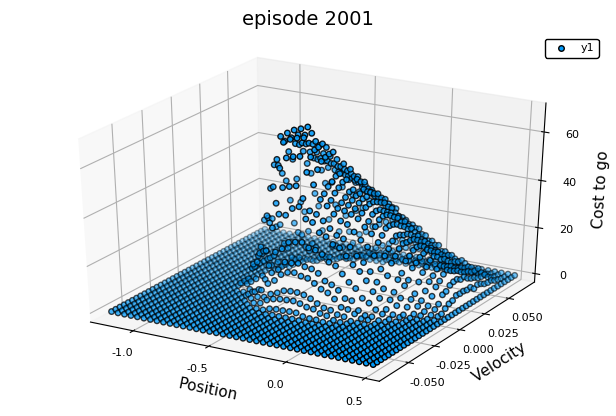

In [21]:
episodes = 2000
plot_episodes = [1, 100, episodes/2, episodes]
num_of_tilings = 8
α = 0.3
value_function = ValueFunction(α, num_of_tilings)
for ep in 1:episodes
    semi_gradient_n_step_sarsa(value_function)
    if ep in plot_episodes
        grid_size = 40
        positions = range(POSITION_MIN, stop=POSITION_MAX, length=grid_size)
        velocities = range(VELOCITY_MIN, stop=VELOCITY_MAX, length=grid_size)
        axis_x = []
        axis_y = []
        axis_z = []
        for position in positions
            for velocity in velocities
                push!(axis_x, position)
                push!(axis_y, velocity)
                push!(axis_z, cost_to_go(value_function, position, velocity))
            end
        end
        Plots.scatter(axis_x, axis_y, axis_z, zaxis="Cost to go", title="episode $(ep+1)")
        Plots.xaxis!("Position")
        Plots.yaxis!("Velocity")
        Plots.savefig(string(ep))
    end
end
